# Data Cleansing and Manipulation 

We are here to explore the dataset for San Fransisco Dataset for the building permissions and we will be running some data cleansing processes to have a better clean data that we can use it in complicated ML Algorithms 


## 1. Importing The important libraries and San Fransisco Dataset for the Building Permission

## 2. Checking Null Values  


**2.1. Lookup for values in another dataset and substitute the NAN.**

**Example A : Street Suffix From San Fransisco API**  

**Example B : Getting Zip Codes From Coordinates Geocoding API**


**2.2. Substituting NaN Values with a Default Value.**


2. Data Extraction and Reducing the memory used  in the dataframe
3. Data Exploration and Manipulation.  
    3.1 : Checking the Null Values

## 3. Working With Dates Columns

## 4. Checking Data Incosistency

## 5. Checking the Outliers in a column

## 6. DataFrame Memory Usage Reducing 


## 1.Importing The important libraries and San Fransisco Dataset for the Building Permission

In [1]:
import pandas as pd
import numpy as np
import requests
from math import nan
import math
from requests import get
import re
import seaborn as sns
import fuzzywuzzy
from fuzzywuzzy import process
import chardet
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
sf_permits = pd.read_csv("Building_Permits.csv")
sf_permits.head()

,Permit Number,Permit Type,Permit Type Definition,Permit Creation Date,Block,Lot,Street Number,Street Number Suffix,Street Name,Street Suffix,...,Existing Construction Type,Existing Construction Type Description,Proposed Construction Type,Proposed Construction Type Description,Site Permit,Supervisor District,Neighborhoods - Analysis Boundaries,Zipcode,Location,Record ID
0,2.02E+11,4,sign - erect,05-06-15,326,23,140,NaN,Ellis,St,...,3.0,constr type 3,NaN,NaN,NaN,3.0,Tenderloin,94102.0,"(37.785719256680785, -122.40852313194863)",1.380000e+12
1,2.02E+11,4,sign - erect,04/19/2016,306,7,440,NaN,Geary,St,...,3.0,constr type 3,NaN,NaN,NaN,3.0,Tenderloin,94102.0,"(37.78733980600732, -122.41063199757738)",1.420000e+12
2,2.02E+11,3,additions alterations or repairs,05/27/2016,595,203,1647,NaN,Pacific,Av,...,1.0,constr type 1,1.0,constr type 1,NaN,3.0,Russian Hill,94109.0,"(37.7946573324287, -122.42232562979227)",1.420000e+12
3,2.02E+11,8,otc alterations permit,11-07-16,156,11,1230,NaN,Pacific,Av,...,5.0,wood frame (5),5.0,wood frame (5),NaN,3.0,Nob Hill,94109.0,"(37.79595867909168, -122.41557405519474)",1.440000e+12
4,2.02E+11,6,demolitions,11/28/2016,342,1,950,NaN,Market,St,...,3.0,constr type 3,NaN,NaN,NaN,6.0,Tenderloin,94102.0,"(37.78315261897309, -122.40950883997789)",1.450000e+11


## 2. Checking Null Values

In [3]:
# get the number of missing data points per column
missing_values_count = sf_permits.isnull().sum()
print(missing_values_count)

# how many total missing values do we have?
total_cells = np.product(sf_permits.shape)
total_missing = missing_values_count.sum()
print("Total Missing Values is "+str(total_missing))

# percent of data that is missing
percent=(total_missing/total_cells) * 100

print("The Percent of Missing Values is "+str(percent.round(2))+' %')


Permit Number                                  0
Permit Type                                    0
Permit Type Definition                         0
Permit Creation Date                           0
Block                                          0
Lot                                            0
Street Number                                  0
Street Number Suffix                      196684
Street Name                                    0
Street Suffix                               2779
Unit                                      169421
Unit Suffix                               196939
Description                                  290
Current Status                                 0
Current Status Date                            0
Filed Date                                     0
Issued Date                                14940
Completed Date                            101709
First Construction Document Date           14946
Structural Notification                   191978
Number of Existing S

Determine by logic whether the NAN values aren't recorded or don't exits, so that we can have multiple solutions


1. Lookup for values in another dataset and substitute the NAN 
2. Filling the NaN Values of some column with a default values
3. drop the rows that contain NaN Values


**1. Lookup for values in another dataset and substitute the NAN.**

**Example A : Street Suffix From San Fransisco API**  

As an example here we will lookup for the street suffix NaN values in the San Fransisco Street Databases from the API

In [4]:
# Getting the Distinct Values of the street columns that has a corresponding NaN in the street suffix column

no_suf_list=sf_permits["Street Name"][sf_permits["Street Suffix"].isnull()].to_list()
set1=set(no_suf_list)
print(set1)

{'Geary', 'Lake Merced Hill So', 'Broadway', 'Avenue H', 'Situs To Be Assigned', 'Via Bufano', 'Mission Bay Blvd South', 'El Camino Del Mar', 'Cole', 'Day', 'Mason', 'Embarcadero Center', 'Mission', 'Avenue D', 'Mission Bay Blvd North', 'Unknown', 'La Playa', 'Clarendon', 'Jefferson', 'Channel', 'Avenue Of The Palms', 'The Embarcadero', 'Avenue I', 'Laguna', 'Avenue G', 'Grand View', 'La Avanzada', 'South Park'}


In [5]:
# Connecting to the API and get a set of  of Street Names with its suffix codes of San Fransisco
r=requests.request("GET","https://data.sfgov.org/resource/6d9h-4u5v.json")
street_suffix_df=pd.DataFrame(r.json())
street_suffix_df.dropna(inplace=True)
street_suffix_df.drop_duplicates(inplace=True,subset="streetname",keep="last")
set2=set(street_suffix_df["streetname"].to_list())
print(set2)

{'FITZGERALD', 'EXETER', 'FUNSTON', 'DELLBROOK', 'EMMA', 'CLAREMONT', 'ERKSON', 'BALBOA', 'FOREST KNOLLS', 'GALILEE', 'BAY VIEW', 'ANKENY', 'ALAMEDA', 'FARNUM', 'CONSERVATORY ACCESS', 'FILLMORE', 'FOWLER', 'GALINDO', 'AQUAVISTA', 'ARBOR', 'FARALLONES', 'AUGUSTA', 'CORONADO', 'DAVENPORT', 'CAMELLIA', 'ELGIN', 'BATTERY CHAMBERLIN', 'CROAKER', 'AMADOR', 'CASSANDRA', 'ATALAYA', 'BEACON', 'DONNER', 'ACME', 'BLANKEN', 'CLEMENT', 'GENERAL KENNEDY', 'BAY SHORE BLVD ON', 'GAVIOTA', 'CRESTLAKE', 'DORADO', 'DIAMOND', 'CONTINUUM', 'FREDSON', 'GENNESSEE', 'CHAVES', 'DON CHEE', 'FREMONT', 'ELWOOD', 'FRANCONIA', 'BEVERLY', 'FULTON', 'BEAUMONT', 'BLYTHDALE', 'ALADDIN', 'ESTERO', 'ALLSTON', '09TH', 'BATTERY CROSBY', 'ADMIRAL', 'AMATISTA', '17TH', 'COTTER', 'ALBION', 'FRESNEL', 'COLON', 'ADELE', 'EVANS', 'BACHE', 'BURR', 'CHARLTON', 'CASTENADA', 'EAST', 'DUDLEY', 'CECILIA', '41ST', 'ARCO', '32ND', 'BALDWIN', 'BERTITA', 'DUNCOMBE', 'CALGARY', 'CAROLINA', 'AMBROSE BIERCE', 'EASTMAN', 'BORICA', 'CUSTOM HOU

In [6]:
#Creating a Dictionary dict1, by looping through each item of Set1 "Streets in our database that don't have a suffix code" and search for the lookup value in Set2 "Database from the API"

dict1={}
for i in set1:
    if i.upper() in set2:
        print("The Street Suffix Of Street " + i +" is ")
        print(street_suffix_df["streettype"].loc[street_suffix_df["streetname"]==i.upper()].values[0])
        dict1[i]=street_suffix_df["streettype"].loc[street_suffix_df["streetname"]==i.upper()].values[0]

The Street Suffix Of Street Geary is 
ST
The Street Suffix Of Street Cole is 
ST
The Street Suffix Of Street Day is 
ST
The Street Suffix Of Street Clarendon is 
AVE
The Street Suffix Of Street Channel is 
ST


**There are 5 Streets in our data base with NAN Suffix that exist in the API Database of SF**

let's take an example of Cole Street and see the NAN Values and then overwrite the NAN Values and Check Again



In [7]:
sf_permits.iloc[:,8:10].loc[(sf_permits["Street Name"]=="Cole") & (pd.isna(sf_permits["Street Suffix"])) ]

,Street Name,Street Suffix
4383,Cole,NaN
82837,Cole,NaN
118371,Cole,NaN
125980,Cole,NaN
143175,Cole,NaN
156958,Cole,NaN
156959,Cole,NaN
169402,Cole,NaN


In [8]:
for i in dict1.keys():
    print(i)
    print(dict1[i])
    sf_permits["Street Suffix"].loc[(sf_permits["Street Name"]==i)&(sf_permits["Street Suffix"]!=dict1[i])]=dict1[i].capitalize()


Geary
ST
Cole
ST
Day
ST
Clarendon
AVE
Channel
ST


Now if we searched for the same example a "Cole Street" we will not find NAN in the suffix

In [10]:
sf_permits.iloc[:,8:10].loc[(sf_permits["Street Name"]=="Cole") & (pd.isna(sf_permits["Street Suffix"])) ]


,Street Name,Street Suffix


**Example B : Getting Zip Codes From Coordinates Geocoding API**


Let's Take another column with different processes of data cleansing 
We have Some rows that have Coordinates and don't have Zip Code, But If we think about it, We can explicitly get the Corresponding Zip code from the coordinates

In [11]:
sf_permits.iloc[:,-3:-1].loc[(pd.isna(sf_permits['Zipcode'])) & (pd.isna(sf_permits['Location'])==0)]


,Zipcode,Location
6766,NaN,"(37.70816952820484, -122.4495824817392)"
18532,NaN,"(37.708334593230155, -122.45827569112961)"
20954,NaN,"(37.70816952820484, -122.4495824817392)"
24780,NaN,"(37.70817427088525, -122.46354383455132)"
60090,NaN,"(37.70817427088525, -122.46354383455132)"
62943,NaN,"(37.708226716717746, -122.43716527609189)"
73498,NaN,"(37.708204600085985, -122.4630562449027)"
92845,NaN,"(37.80840337746089, -122.41669645885156)"
105273,NaN,"(37.708219005746415, -122.46360939461846)"
106465,NaN,"(37.708219005746415, -122.46360939461846)"


In [12]:
coordinates_list=sf_permits.iloc[:,-2].loc[(pd.isna(sf_permits['Zipcode'])) & (pd.isna(sf_permits['Location'])==0)].to_list()

coordinates_list

['(37.70816952820484, -122.4495824817392)',
 '(37.708334593230155, -122.45827569112961)',
 '(37.70816952820484, -122.4495824817392)',
 '(37.70817427088525, -122.46354383455132)',
 '(37.70817427088525, -122.46354383455132)',
 '(37.708226716717746, -122.43716527609189)',
 '(37.708204600085985, -122.4630562449027)',
 '(37.80840337746089, -122.41669645885156)',
 '(37.708219005746415, -122.46360939461846)',
 '(37.708219005746415, -122.46360939461846)',
 '(37.80853240658687, -122.41871612760727)',
 '(37.70820204855604, -122.45808060383742)',
 '(37.7082011113186, -122.46030421092122)',
 '(37.708219784150785, -122.43911130693756)',
 '(37.708227892547924, -122.44941181531472)',
 '(37.80839250874325, -122.4237836956073)']

Some data cleansing of the coordinates to be able to iterate through it in the API of Geocoding

In [13]:
lat_list=[]
lng_list=[]
for i in coordinates_list:
    lat=i.split(',')[0].replace("(","")
    lng=i.split(',')[1].replace(")","").replace(" ","")

    lat_list.append(lat)
    lng_list.append(lng)
print(lat_list)
print(lng_list)


['37.70816952820484', '37.708334593230155', '37.70816952820484', '37.70817427088525', '37.70817427088525', '37.708226716717746', '37.708204600085985', '37.80840337746089', '37.708219005746415', '37.708219005746415', '37.80853240658687', '37.70820204855604', '37.7082011113186', '37.708219784150785', '37.708227892547924', '37.80839250874325']
['-122.4495824817392', '-122.45827569112961', '-122.4495824817392', '-122.46354383455132', '-122.46354383455132', '-122.43716527609189', '-122.4630562449027', '-122.41669645885156', '-122.46360939461846', '-122.46360939461846', '-122.41871612760727', '-122.45808060383742', '-122.46030421092122', '-122.43911130693756', '-122.44941181531472', '-122.4237836956073']


In [14]:
zip_list=[]
for i in range(len(lat_list)):
    coord_zip_page="https://api.bigdatacloud.net/data/reverse-geocode-client?latitude={}&longitude={}&localityLanguage=en".format(lat_list[i],lng_list[i])
    r=requests.request("Get",coord_zip_page)
    zip=r.json()["postcode"]
    zip_list.append(zip)
zip_list

['94014',
 '94112',
 '94014',
 '94014',
 '94014',
 '94112',
 '94112',
 '94133',
 '94112',
 '94112',
 '94109',
 '94014',
 '94014',
 '94014',
 '94112',
 '94109']

In [15]:
no_zip_rows=sf_permits.iloc[:,-3].loc[(pd.isna(sf_permits['Zipcode'])) & (pd.isna(sf_permits['Location'])==0)]
no_zip_rows

6766     NaN
18532    NaN
20954    NaN
24780    NaN
60090    NaN
62943    NaN
73498    NaN
92845    NaN
105273   NaN
106465   NaN
116164   NaN
139732   NaN
158954   NaN
165542   NaN
183375   NaN
197441   NaN
Name: Zipcode, dtype: float64

In [16]:
no_zip_rows


6766     NaN
18532    NaN
20954    NaN
24780    NaN
60090    NaN
62943    NaN
73498    NaN
92845    NaN
105273   NaN
106465   NaN
116164   NaN
139732   NaN
158954   NaN
165542   NaN
183375   NaN
197441   NaN
Name: Zipcode, dtype: float64

In [17]:
no_zip_rows=zip_list

**2. Substituting NaN Values with a Default Value.**


In [19]:
#filling Null with None in a column to not delete it when droping na

sf_permits['Street Suffix'].isnull().sum()

2752

In [20]:
sf_permits['Street Suffix'].fillna('Not Exist',inplace=True)
sf_permits['Street Suffix'].isnull().sum()

0

In [21]:
### Defining a Function to reduce the memory usage in processing the dataframe by changing the columns data types 

## 3. Working With Dates Columns

In [22]:
sf_permits["Permit Creation Date"].head()



0      05-06-15
1    04/19/2016
2    05/27/2016
3      11-07-16
4    11/28/2016
Name: Permit Creation Date, dtype: object

Data Type is Object and we need to change it to date time type , we initiate a new column

In [23]:
sf_permits["Date Parsed"]=pd.to_datetime(sf_permits["Permit Creation Date"])

sf_permits["Date Parsed"].head()


0   2015-05-06
1   2016-04-19
2   2016-05-27
3   2016-11-07
4   2016-11-28
Name: Date Parsed, dtype: datetime64[ns]

<AxesSubplot:xlabel='Date Parsed'>

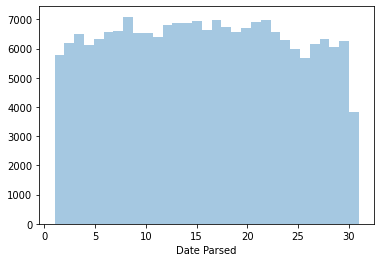

In [24]:
# Plot the day of the month to check the date parsing is true

day_of_month_slides = sf_permits["Date Parsed"].dt.day

day_of_month_slides = day_of_month_slides.dropna()

sns.distplot(day_of_month_slides, kde=False, bins=31)


## 4. Checking Data Incosistency

In [26]:
status = sf_permits['Current Status'].unique()
status


array(['expired ', 'issued      ', 'withdrawn', 'complete', 'issued',
       'issued         ', 'Issued', 'filed ', 'ISSUED',
       'FILED               ', 'filed', 'Approved', 'completed',
       'reinstated', 'cancelled', 'canceled', 'expired', 'appeal',
       'withdraw', 'approved', 'suspend', 'revoked', 'plancheck',
       'disapproved', 'incomplete'], dtype=object)

we will note that some of the values are mis written such as  **"cancelled"** and **"canceled"**,**"Withdrawn** and **Withdraw"**, **"filed"**and **"FILED"**, some values have **spaces**
That is due to wrong data entry and will lead to data inconsistency

In [27]:
#1. Convert all to lower case
sf_permits['Current Status']=sf_permits['Current Status'].str.lower()
#2.remove spaces
sf_permits['Current Status']=sf_permits['Current Status'].str.strip()

status = sf_permits['Current Status'].unique()
status.sort()
status

array(['appeal', 'approved', 'canceled', 'cancelled', 'complete',
       'completed', 'disapproved', 'expired', 'filed', 'incomplete',
       'issued', 'plancheck', 'reinstated', 'revoked', 'suspend',
       'withdraw', 'withdrawn'], dtype=object)

We will be using FuzzyWuzzy to help identify which string are closest to each other.
sort them alphabetically and then take a closer look, let's for example search for cancelled

In [28]:
matches = fuzzywuzzy.process.extract("cancelled", status, limit=5, scorer=fuzzywuzzy.fuzz.token_sort_ratio)
matches

[('cancelled', 100),
 ('canceled', 94),
 ('completed', 44),
 ('plancheck', 44),
 ('filed', 43)]

let's define a function that takes a word we want to search wih and subsitute any other string that looks similar to this word

In [29]:
def replace_matches_in_column(df, column, string_to_match, min_ratio = 90):
    # get a list of unique strings
    strings = df[column].unique()
    
    # get the top 5 closest matches to our input string
    matches = fuzzywuzzy.process.extract(string_to_match, strings, 
                                         limit=5, scorer=fuzzywuzzy.fuzz.token_sort_ratio)

    # only get matches with a ratio > 90
    close_matches = [matches[0] for matches in matches if matches[1] >= min_ratio]

    # get the rows of all the close matches in our dataframe
    rows_with_matches = df[column].isin(close_matches)

    # replace all rows with close matches with the input matches 
    df.loc[rows_with_matches, column] = string_to_match
    
    # let us know the function's done
    print("All done!")

In [30]:
replace_matches_in_column(sf_permits, "Current Status","cancelled", min_ratio = 90)
replace_matches_in_column(sf_permits, "Current Status","completed", min_ratio = 90)
replace_matches_in_column(sf_permits, "Current Status","withdrawn", min_ratio = 90)



All done!
All done!
All done!


In [31]:
status = sf_permits['Current Status'].unique()
status.sort()
status

array(['appeal', 'approved', 'cancelled', 'completed', 'disapproved',
       'expired', 'filed', 'incomplete', 'issued', 'plancheck',
       'reinstated', 'revoked', 'suspend', 'withdrawn'], dtype=object)

We could successfully eliminate the inconsistency due to data entry 

## 5. Checking the Outliers in a column

by a short look to the column "Number of Exisitng Column", We can find unreasonable values such as -800 stories , 90000 stories .. those are outliers that will affect any data model uses this data set

In [34]:
sf_permits["Number of Existing Stories"].describe()


count    156117.000000
mean          6.357107
std         230.121245
min        -800.000000
25%           2.000000
50%           3.000000
75%           4.000000
max       90000.000000
Name: Number of Existing Stories, dtype: float64

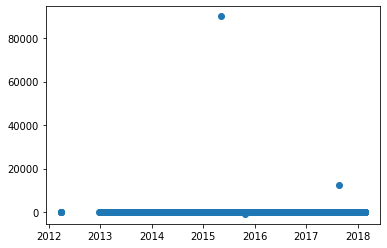

In [35]:
plt.scatter(sf_permits["Date Parsed"],sf_permits["Number of Existing Stories"])


Check for the outliers using the mean and the standard deviation 

In [36]:
outliers=sf_permits["Number of Existing Stories"][ np.abs(sf_permits["Number of Existing Stories"] - sf_permits["Number of Existing Stories"].mean()) > 1.5*sf_permits["Number of Existing Stories"].std() ]
outliers

0         90000.0
103915     -800.0
179620    12500.0
Name: Number of Existing Stories, dtype: float64

In [37]:
outliers_rows_index=list(outliers.index)
sf_permits.drop(sf_permits.index[[outliers_rows_index]],inplace=True)
sf_permits["Number of Existing Stories"].describe()

count    156114.000000
mean          5.705782
std           8.613509
min           0.000000
25%           2.000000
50%           3.000000
75%           4.000000
max          78.000000
Name: Number of Existing Stories, dtype: float64

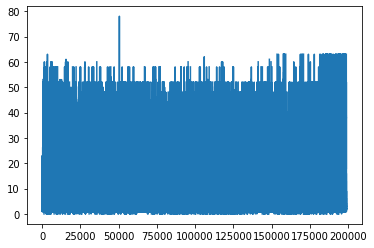

In [38]:
plt.plot(sf_permits["Number of Existing Stories"])


Values between 0 and 78 sounds reasonable

## 6. DataFrame Memory Usage Reducing 

we will define a function to reduce the memory usage of our dataset by changing some columns data types, this will help alot in processing the datasets into complicated ML Models, and it's value is magnified for the large datasets

In [39]:
def reduce_mem_usage(props):
    start_mem_usg = props.memory_usage().sum() / 1024**2 
    print("Memory usage of properties dataframe is :",start_mem_usg," MB")
    NAlist = [] # Keeps track of columns that have missing values filled in. 
    for col in props.columns:
        if props[col].dtype != object:  # Exclude strings
            
            # Print current column type
            print("******************************")
            print("Column: ",col)
            print("dtype before: ",props[col].dtype)
            
            # make variables for Int, max and min
            IsInt = False
            mx = props[col].max()
            mn = props[col].min()
            
            # Integer does not support NA, therefore, NA needs to be filled
            if not np.isfinite(props[col]).all(): 
                NAlist.append(col)
                props[col].fillna(mn-1,inplace=True)  
                   
            # test if column can be converted to an integer
            asint = props[col].fillna(0).astype(np.int64)
            result = (props[col] - asint)
            result = result.sum()
            if result > -0.01 and result < 0.01:
                IsInt = True

            
            # Make Integer/unsigned Integer datatypes
            if IsInt:
                if mn >= 0:
                    if mx < 255:
                        props[col] = props[col].astype(np.uint8)
                    elif mx < 65535:
                        props[col] = props[col].astype(np.uint16)
                    elif mx < 4294967295:
                        props[col] = props[col].astype(np.uint32)
                    else:
                        props[col] = props[col].astype(np.uint64)
                else:
                    if mn > np.iinfo(np.int8).min and mx < np.iinfo(np.int8).max:
                        props[col] = props[col].astype(np.int8)
                    elif mn > np.iinfo(np.int16).min and mx < np.iinfo(np.int16).max:
                        props[col] = props[col].astype(np.int16)
                    elif mn > np.iinfo(np.int32).min and mx < np.iinfo(np.int32).max:
                        props[col] = props[col].astype(np.int32)
                    elif mn > np.iinfo(np.int64).min and mx < np.iinfo(np.int64).max:
                        props[col] = props[col].astype(np.int64)    
            
            # Make float datatypes 32 bit
            else:
                props[col] = props[col].astype(np.float32)
            
            # Print new column type
            print("dtype after: ",props[col].dtype)
            print("******************************")
    
    # Print final result
    print("___MEMORY USAGE AFTER COMPLETION:___")
    mem_usg = props.memory_usage().sum() / 1024**2 
    print("Memory usage is: ",mem_usg," MB")
    print("This is ",100*mem_usg/start_mem_usg,"% of the initial size")
    return props, NAlist


In [41]:
sf_permits, NAlist = reduce_mem_usage(sf_permits.iloc[:,:-1])
print("_________________")
print("")
print("Warning: the following columns have missing values filled with 'df['column_name'].min() -1': ")
print("_________________")
print("")
print(NAlist)

Memory usage of properties dataframe is : 45.52391052246094  MB
******************************
Column:  Permit Type
dtype before:  int64
dtype after:  uint8
******************************
******************************
Column:  Street Number
dtype before:  int64
dtype after:  uint16
******************************
******************************
Column:  Unit
dtype before:  float64
dtype after:  uint16
******************************
******************************
Column:  Number of Existing Stories
dtype before:  float64
dtype after:  float32
******************************
******************************
Column:  Number of Proposed Stories
dtype before:  float64
dtype after:  float32
******************************
******************************
Column:  Estimated Cost
dtype before:  float64
dtype after:  float32
******************************
******************************
Column:  Revised Cost
dtype before:  float64
dtype after:  float32
******************************
*******************